# Style Blending Experiment

In [1]:
%load_ext autoreload
%autoreload 2
from FaceSpace import PreprocessFaceDir, MakeFaceData, MakeFaceModel, TrainFaceModel
from FaceSpace import SaveFaceSpace, LoadFaceSpace, GetFaceFromZSpace, ShowFace 

### Preprocess raw photos to get cropped, aligned photo

In [2]:
RawImagesPath = 'TseHao FaceSpace/images'
AlignedImagesPath = 'TseHao FaceSpace/images/aligned'
PreprocessFaceDir(RawImagesPath, AlignedImagesPath)

### Make FaceData object based on aligned image

Getting tensors of (aligned) face images
ZDims unspecified, will be inferred from number of images provided.
Zdims set equal to Size:  1
Using default Zspace - identity matrix (orthogonal vectors) of dim  1
Using default Wspace - zero matrix of dim  1


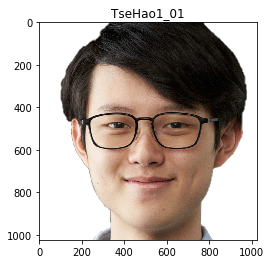

Reshaped Wspace to match number of stored faces, Wspace dim:  torch.Size([1, 18, 512])
Note: Feature Maps take up a large amount of memory, and will result in a large object file if saved.
Getting feature maps for training...
Done
Setting Wspaces to be the mean latent vector from  W_mean.pt


In [99]:
FaceData = MakeFaceData('TseHao FaceSpace/images/aligned', GetFacesFeatures=False)

### Make FaceModel based on FaceData object
#### FaceModel is the StyleGAN synthesis network

In [6]:
FaceModel = MakeFaceModel(FaceData).g_all.g_synthesis

No Zdims explicitly specified, inferring Zdims from FaceData, Zdims=1


### Training function

In [2]:
import torch
import torch.nn as nn
import time
import functools
from get_features import MakeFeatureModel, GetFeatures
import numpy as np
from plot_utils import ShowModelOutput

def TrainLatentsEnc(Model, FaceLatents, Epochs_n, LearnRate, BatchSize=2,\
                    Weight_feature=1e2, Weight_pixel=1, Weight_tv=0, LayerCutoff=9, TrainStyle=False,\
                    StoredTargetFeatures=False, PrintInterval=20, MaxBatchPrint=10, UseCuda=True):
    # Initialisation of model
    if UseCuda:
        device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
        if device == 'cpu':
            raise Warning('UseCuda was set true but cuda is not available, using cpu')
    else:
        device = 'cpu'

    if device != FaceLatents.device:
        print('Training function and FaceLatents class are using different devices')
    Model = Model.to(device)
    for param in Model.parameters():
        param.requires_grad = False

    # Initialise learnable parameters
    OptimParams = [FaceLatents.Wspace]
    Optimiser = torch.optim.Adam(OptimParams, lr=LearnRate)
    
    # Initialise loss variables
    Loss = torch.tensor(0, device=device).float()
    Loss_feature = torch.tensor(0, device=device).float()
    Loss_pixel = torch.tensor(0, device=device).float()

    # Initialise feature model to get feature maps from
    if Weight_feature > 0:
        FeatureModel = MakeFeatureModel(modelName='vgg16')

    # Calculate batches
    Batch_n = FaceLatents.Size // BatchSize
    if FaceLatents.Size % BatchSize is not 0:
        Batch_n += 1

    # Training loop
    TimeStart = time.time()
    for Epoch_i in range(1, Epochs_n+1):
        # Shuffle batch indices
        RandIdx = list(np.random.permutation(FaceLatents.Size))

        for Batch_i in range(Batch_n):
            # Reset gradients
            Optimiser.zero_grad()

            # Get a batch
            StartIdx = Batch_i*BatchSize
            EndIdx = StartIdx + BatchSize
            BatchIdx = RandIdx[StartIdx:EndIdx]
            Wspace = FaceLatents.Wspace[BatchIdx].to(device)
            Faces = FaceLatents.Faces[BatchIdx].to(device)
            
            # Get target features for the batch
            if StoredTargetFeatures:
                TargetFeatures = [Maps[BatchIdx].to(device) for Maps in FaceLatents.FeatureMaps]
            else:
                Faces_ds = nn.functional.interpolate(Faces, size=(256,256), mode='bilinear')
                TargetFeatures = GetFeatures(Faces_ds, FeatureModel)

            # Get model output from Wspace
            if LayerCutoff is not None:
                if not TrainStyle:
                    WspaceCutoff = torch.cat([Wspace[:,:LayerCutoff,:], 
                                              Wspace[:,LayerCutoff:,:].detach()], dim=1)
                else:
                    WspaceCutoff = torch.cat([Wspace[:,:LayerCutoff,:].detach(), 
                                              Wspace[:,LayerCutoff:,:]], dim=1)
                ModelOut = Model(WspaceCutoff)
            else:
                ModelOut = Model(Wspace)

            # Standardise output pixel values to [0,1]
            ModelOut = ModelOut.clone().clamp_(-1, 1).add_(1).div_(2.0)

            # Compute feature (perceptual) loss
            Loss_feature = torch.tensor(0, device=device).float()
            if Weight_feature > 0:
                ModelOut_ds = nn.functional.interpolate(ModelOut, size=(256,256), mode='bilinear')
                OutFeatures = GetFeatures(ModelOut_ds, FeatureModel)
                Loss_feature = functools.reduce(
                    lambda x,y : x + y , 
                    [nn.functional.l1_loss(Features[0], Features[1])\
                     for Features in zip(OutFeatures, TargetFeatures)]) 
            
            # Compute pixel loss
            Loss_pixel = nn.functional.mse_loss(ModelOut, Faces)
            
            # Compute total variation loss
            Loss_tv = nn.functional.mse_loss(Wspace, Wspace.detach().mean(dim=1))
                
            # Aggregate losses
            Loss = Weight_feature*Loss_feature + Weight_pixel*Loss_pixel + Weight_tv*Loss_tv
            
            # Print metrics
            if (Epoch_i == 1 or Epoch_i == Epochs_n or Epoch_i % PrintInterval == 0) \
                and Batch_i < MaxBatchPrint:
                print('Epoch: ', Epoch_i)
                print('Batch: ', Batch_i + 1)
                print('This batch: ', [FaceLatents.FaceNames[Idx] for Idx in BatchIdx])
                print('Total time elapsed: ', time.time()-TimeStart, ' s')
                print('Feature loss: ', Loss_feature.item(), \
                      ' | Pixel loss: ', Loss_pixel.item(), \
                      ' | Total var. loss: ', Loss_tv.item())
                print('Weighted - Feature loss: ', Weight_feature*Loss_feature.item(), \
                      ' | Pixel loss: ', Weight_pixel*Loss_pixel.item(), \
                      ' | Total var. loss: ', Weight_tv*Loss_tv.item())
                print('Total loss: ', Loss.item())
                print('Target W+ output')
                ShowModelOutput(ModelOut)

            # Perform gradient descent and backprop
            Loss.backward()
            Optimiser.step()

Epoch:  1
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  0.26189756393432617  s
Feature loss:  5.578693389892578  | Pixel loss:  0.00256719090975821  | Total var. loss:  0.12068721652030945
Weighted - Feature loss:  557.8693389892578  | Pixel loss:  2567.19090975821  | Total var. loss:  0.0
Total loss:  3125.060302734375
Target W+ output


/home/tsehao/anaconda3/envs/tth20191007/lib/python3.7/site-packages/ipykernel_launcher.py:97: UserWarning: Using a target size (torch.Size([1, 512])) that is different to the input size (torch.Size([1, 18, 512])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.


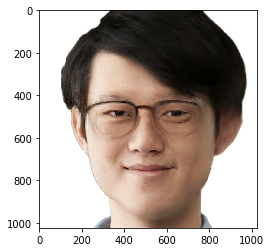

Epoch:  25
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  5.080221891403198  s
Feature loss:  7.134942531585693  | Pixel loss:  0.0035194980446249247  | Total var. loss:  0.12190748751163483
Weighted - Feature loss:  713.4942531585693  | Pixel loss:  3519.4980446249247  | Total var. loss:  0.0
Total loss:  4232.9921875
Target W+ output


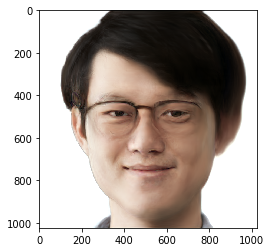

Epoch:  50
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  10.051384449005127  s
Feature loss:  6.790412902832031  | Pixel loss:  0.0026351127307862043  | Total var. loss:  0.12287647277116776
Weighted - Feature loss:  679.0412902832031  | Pixel loss:  2635.1127307862043  | Total var. loss:  0.0
Total loss:  3314.154052734375
Target W+ output


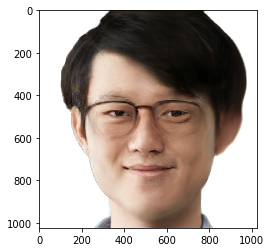

Epoch:  75
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  15.024455070495605  s
Feature loss:  6.592744827270508  | Pixel loss:  0.0024253285955637693  | Total var. loss:  0.12351848185062408
Weighted - Feature loss:  659.2744827270508  | Pixel loss:  2425.3285955637693  | Total var. loss:  0.0
Total loss:  3084.60302734375
Target W+ output


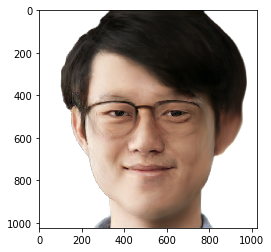

Epoch:  100
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  19.992796659469604  s
Feature loss:  6.509757995605469  | Pixel loss:  0.0023208248894661665  | Total var. loss:  0.12411635369062424
Weighted - Feature loss:  650.9757995605469  | Pixel loss:  2320.8248894661665  | Total var. loss:  0.0
Total loss:  2971.80078125
Target W+ output


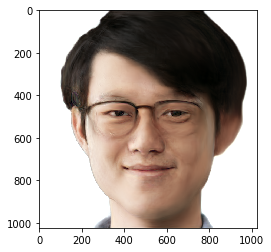

Epoch:  125
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  24.959131002426147  s
Feature loss:  6.476625442504883  | Pixel loss:  0.002249948913231492  | Total var. loss:  0.12465105950832367
Weighted - Feature loss:  647.6625442504883  | Pixel loss:  2249.948913231492  | Total var. loss:  0.0
Total loss:  2897.611572265625
Target W+ output


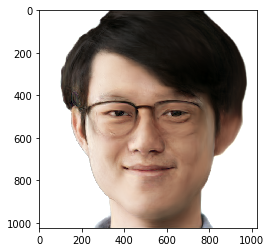

Epoch:  150
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  30.035216331481934  s
Feature loss:  6.468725204467773  | Pixel loss:  0.0021908082999289036  | Total var. loss:  0.1252252459526062
Weighted - Feature loss:  646.8725204467773  | Pixel loss:  2190.8082999289036  | Total var. loss:  0.0
Total loss:  2837.680908203125
Target W+ output


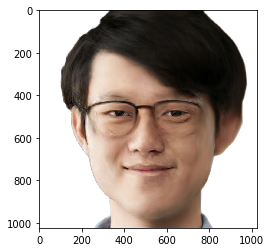

Epoch:  175
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  35.22676062583923  s
Feature loss:  6.464381694793701  | Pixel loss:  0.002137209055945277  | Total var. loss:  0.12582391500473022
Weighted - Feature loss:  646.4381694793701  | Pixel loss:  2137.209055945277  | Total var. loss:  0.0
Total loss:  2783.647216796875
Target W+ output


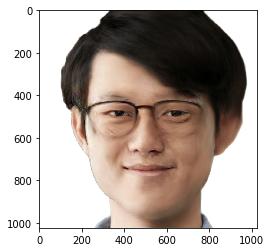

Epoch:  200
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  40.212032318115234  s
Feature loss:  6.461045265197754  | Pixel loss:  0.00208353903144598  | Total var. loss:  0.126385897397995
Weighted - Feature loss:  646.1045265197754  | Pixel loss:  2083.53903144598  | Total var. loss:  0.0
Total loss:  2729.6435546875
Target W+ output


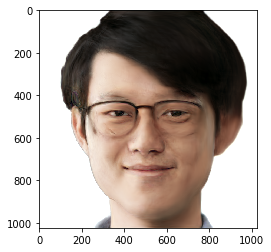

Epoch:  225
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  45.19179034233093  s
Feature loss:  6.459794044494629  | Pixel loss:  0.0020313302520662546  | Total var. loss:  0.1269531399011612
Weighted - Feature loss:  645.9794044494629  | Pixel loss:  2031.3302520662546  | Total var. loss:  0.0
Total loss:  2677.3095703125
Target W+ output


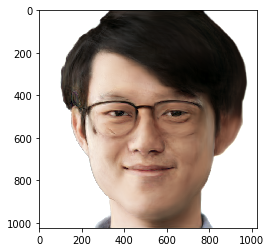

Epoch:  250
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  50.302846908569336  s
Feature loss:  6.467048168182373  | Pixel loss:  0.0019751323852688074  | Total var. loss:  0.127491295337677
Weighted - Feature loss:  646.7048168182373  | Pixel loss:  1975.1323852688074  | Total var. loss:  0.0
Total loss:  2621.83740234375
Target W+ output


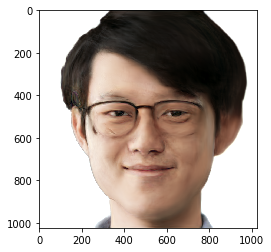

Epoch:  275
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  55.39663362503052  s
Feature loss:  6.47958517074585  | Pixel loss:  0.001918353489600122  | Total var. loss:  0.128114253282547
Weighted - Feature loss:  647.958517074585  | Pixel loss:  1918.353489600122  | Total var. loss:  0.0
Total loss:  2566.31201171875
Target W+ output


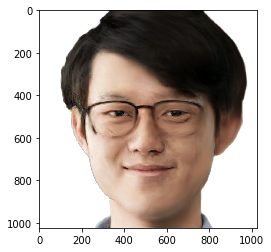

Epoch:  300
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  60.39007377624512  s
Feature loss:  6.491443634033203  | Pixel loss:  0.0018446356989443302  | Total var. loss:  0.12879309058189392
Weighted - Feature loss:  649.1443634033203  | Pixel loss:  1844.6356989443302  | Total var. loss:  0.0
Total loss:  2493.780029296875
Target W+ output


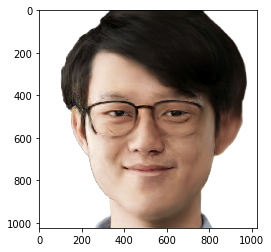

Epoch:  325
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  65.41938090324402  s
Feature loss:  6.492400169372559  | Pixel loss:  0.0017698787851259112  | Total var. loss:  0.12941689789295197
Weighted - Feature loss:  649.2400169372559  | Pixel loss:  1769.8787851259112  | Total var. loss:  0.0
Total loss:  2419.11865234375
Target W+ output


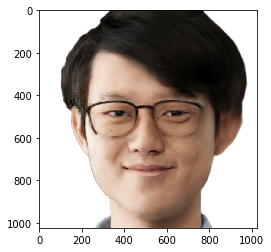

Epoch:  350
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  70.39986634254456  s
Feature loss:  6.488333225250244  | Pixel loss:  0.0017214141553267837  | Total var. loss:  0.1300629824399948
Weighted - Feature loss:  648.8333225250244  | Pixel loss:  1721.4141553267837  | Total var. loss:  0.0
Total loss:  2370.24755859375
Target W+ output


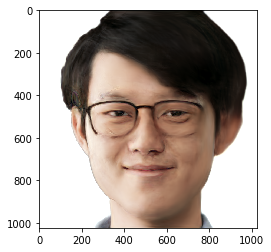

Epoch:  375
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  75.48554134368896  s
Feature loss:  6.4721999168396  | Pixel loss:  0.0016689145704731345  | Total var. loss:  0.13068954646587372
Weighted - Feature loss:  647.21999168396  | Pixel loss:  1668.9145704731345  | Total var. loss:  0.0
Total loss:  2316.134521484375
Target W+ output


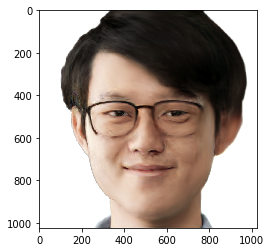

Epoch:  400
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  80.45797204971313  s
Feature loss:  6.448212146759033  | Pixel loss:  0.0016145161353051662  | Total var. loss:  0.13135164976119995
Weighted - Feature loss:  644.8212146759033  | Pixel loss:  1614.5161353051662  | Total var. loss:  0.0
Total loss:  2259.33740234375
Target W+ output


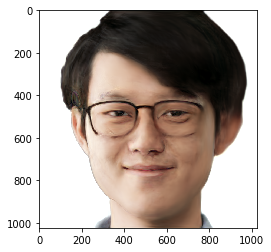

Epoch:  425
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  85.43133568763733  s
Feature loss:  6.421092987060547  | Pixel loss:  0.0015788659220561385  | Total var. loss:  0.1320432722568512
Weighted - Feature loss:  642.1092987060547  | Pixel loss:  1578.8659220561385  | Total var. loss:  0.0
Total loss:  2220.975341796875
Target W+ output


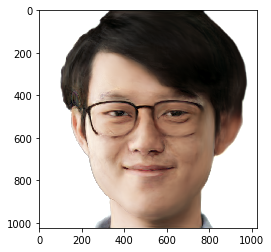

Epoch:  450
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  90.4124972820282  s
Feature loss:  6.4219207763671875  | Pixel loss:  0.0015973825938999653  | Total var. loss:  0.13270138204097748
Weighted - Feature loss:  642.1920776367188  | Pixel loss:  1597.3825938999653  | Total var. loss:  0.0
Total loss:  2239.57470703125
Target W+ output


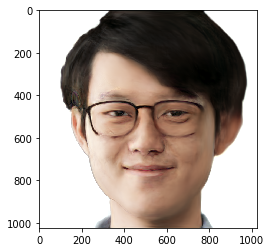

Epoch:  475
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  95.62939310073853  s
Feature loss:  6.364778518676758  | Pixel loss:  0.0015060784062370658  | Total var. loss:  0.13332101702690125
Weighted - Feature loss:  636.4778518676758  | Pixel loss:  1506.0784062370658  | Total var. loss:  0.0
Total loss:  2142.55615234375
Target W+ output


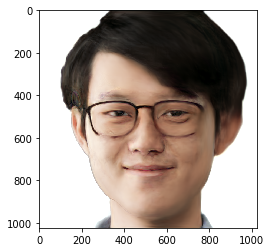

Epoch:  500
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  100.83383846282959  s
Feature loss:  6.38176965713501  | Pixel loss:  0.0015424924204126  | Total var. loss:  0.13392338156700134
Weighted - Feature loss:  638.176965713501  | Pixel loss:  1542.4924204126  | Total var. loss:  0.0
Total loss:  2180.66943359375
Target W+ output


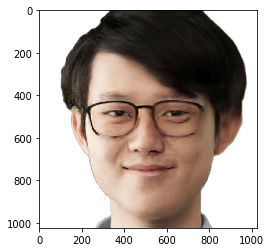

Epoch:  525
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  105.86102890968323  s
Feature loss:  6.319891929626465  | Pixel loss:  0.001451547141186893  | Total var. loss:  0.13454462587833405
Weighted - Feature loss:  631.9891929626465  | Pixel loss:  1451.547141186893  | Total var. loss:  0.0
Total loss:  2083.536376953125
Target W+ output


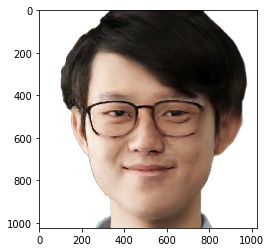

Epoch:  550
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  110.84776258468628  s
Feature loss:  6.32376766204834  | Pixel loss:  0.001457617967389524  | Total var. loss:  0.13507725298404694
Weighted - Feature loss:  632.376766204834  | Pixel loss:  1457.617967389524  | Total var. loss:  0.0
Total loss:  2089.99462890625
Target W+ output


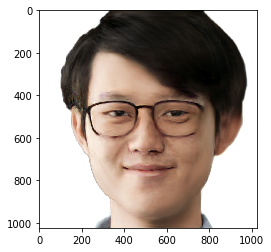

Epoch:  575
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  115.848788022995  s
Feature loss:  6.30805778503418  | Pixel loss:  0.001448864582926035  | Total var. loss:  0.13565698266029358
Weighted - Feature loss:  630.805778503418  | Pixel loss:  1448.864582926035  | Total var. loss:  0.0
Total loss:  2079.67041015625
Target W+ output


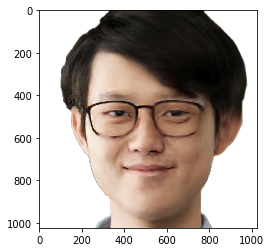

Epoch:  600
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  120.82259607315063  s
Feature loss:  6.293883323669434  | Pixel loss:  0.0014341417700052261  | Total var. loss:  0.13622529804706573
Weighted - Feature loss:  629.3883323669434  | Pixel loss:  1434.1417700052261  | Total var. loss:  0.0
Total loss:  2063.530029296875
Target W+ output


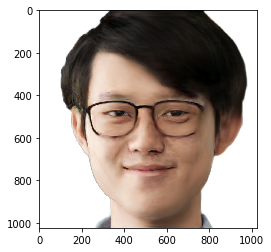

Epoch:  625
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  125.8025209903717  s
Feature loss:  6.317767143249512  | Pixel loss:  0.0014593423111364245  | Total var. loss:  0.13683950901031494
Weighted - Feature loss:  631.7767143249512  | Pixel loss:  1459.3423111364245  | Total var. loss:  0.0
Total loss:  2091.119140625
Target W+ output


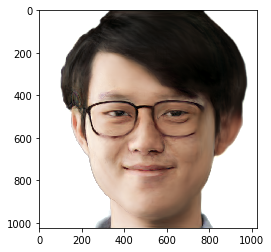

Epoch:  650
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  130.9875247478485  s
Feature loss:  6.242371559143066  | Pixel loss:  0.0013428666861727834  | Total var. loss:  0.13752895593643188
Weighted - Feature loss:  624.2371559143066  | Pixel loss:  1342.8666861727834  | Total var. loss:  0.0
Total loss:  1967.1038818359375
Target W+ output


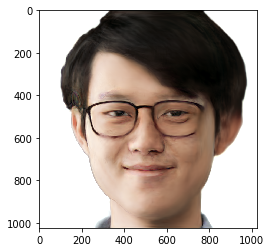

Epoch:  675
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  136.1339569091797  s
Feature loss:  6.31182336807251  | Pixel loss:  0.0014807808911427855  | Total var. loss:  0.1381639689207077
Weighted - Feature loss:  631.182336807251  | Pixel loss:  1480.7808911427855  | Total var. loss:  0.0
Total loss:  2111.963134765625
Target W+ output


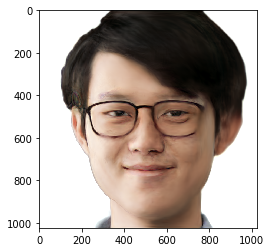

Epoch:  700
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  141.2549705505371  s
Feature loss:  6.2074761390686035  | Pixel loss:  0.0012974386336281896  | Total var. loss:  0.13884536921977997
Weighted - Feature loss:  620.7476139068604  | Pixel loss:  1297.4386336281896  | Total var. loss:  0.0
Total loss:  1918.186279296875
Target W+ output


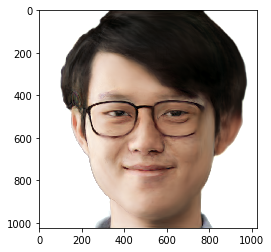

Epoch:  725
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  146.2459909915924  s
Feature loss:  6.219379425048828  | Pixel loss:  0.00133183179423213  | Total var. loss:  0.13945640623569489
Weighted - Feature loss:  621.9379425048828  | Pixel loss:  1331.83179423213  | Total var. loss:  0.0
Total loss:  1953.769775390625
Target W+ output


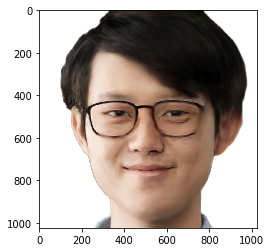

Epoch:  750
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  151.33234238624573  s
Feature loss:  6.175785064697266  | Pixel loss:  0.0012762880651280284  | Total var. loss:  0.14017263054847717
Weighted - Feature loss:  617.5785064697266  | Pixel loss:  1276.2880651280284  | Total var. loss:  0.0
Total loss:  1893.8665771484375
Target W+ output


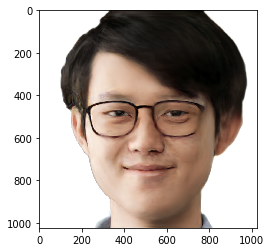

Epoch:  775
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  156.5949935913086  s
Feature loss:  6.287156581878662  | Pixel loss:  0.0015382473357021809  | Total var. loss:  0.1408187448978424
Weighted - Feature loss:  628.7156581878662  | Pixel loss:  1538.2473357021809  | Total var. loss:  0.0
Total loss:  2166.962890625
Target W+ output


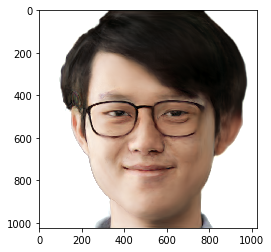

Epoch:  800
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  161.57920217514038  s
Feature loss:  6.1497907638549805  | Pixel loss:  0.0012345918221399188  | Total var. loss:  0.14151740074157715
Weighted - Feature loss:  614.979076385498  | Pixel loss:  1234.5918221399188  | Total var. loss:  0.0
Total loss:  1849.57080078125
Target W+ output


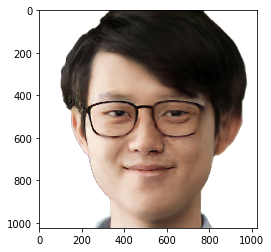

Epoch:  825
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  166.65004801750183  s
Feature loss:  6.220048427581787  | Pixel loss:  0.0014443449908867478  | Total var. loss:  0.14217671751976013
Weighted - Feature loss:  622.0048427581787  | Pixel loss:  1444.3449908867478  | Total var. loss:  0.0
Total loss:  2066.349853515625
Target W+ output


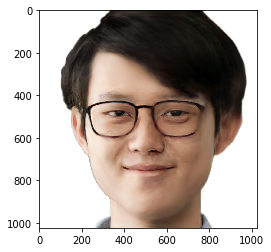

Epoch:  850
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  171.62215328216553  s
Feature loss:  6.101269721984863  | Pixel loss:  0.0011945028090849519  | Total var. loss:  0.14288926124572754
Weighted - Feature loss:  610.1269721984863  | Pixel loss:  1194.5028090849519  | Total var. loss:  0.0
Total loss:  1804.6297607421875
Target W+ output


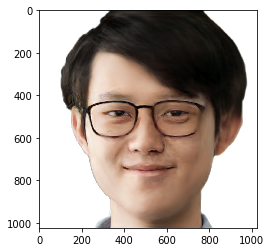

Epoch:  875
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  176.59323072433472  s
Feature loss:  6.086949825286865  | Pixel loss:  0.0011794111924245954  | Total var. loss:  0.1435864269733429
Weighted - Feature loss:  608.6949825286865  | Pixel loss:  1179.4111924245954  | Total var. loss:  0.0
Total loss:  1788.106201171875
Target W+ output


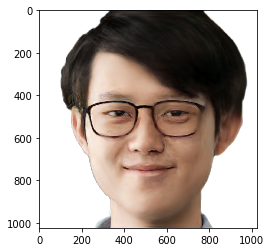

Epoch:  900
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  181.55809426307678  s
Feature loss:  6.103707790374756  | Pixel loss:  0.0012308952864259481  | Total var. loss:  0.1442933976650238
Weighted - Feature loss:  610.3707790374756  | Pixel loss:  1230.8952864259481  | Total var. loss:  0.0
Total loss:  1841.26611328125
Target W+ output


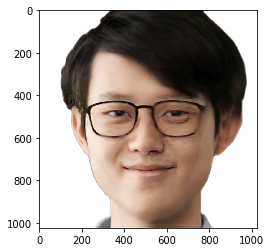

Epoch:  925
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  186.6186397075653  s
Feature loss:  6.044464111328125  | Pixel loss:  0.0011510945623740554  | Total var. loss:  0.14502903819084167
Weighted - Feature loss:  604.4464111328125  | Pixel loss:  1151.0945623740554  | Total var. loss:  0.0
Total loss:  1755.541015625
Target W+ output


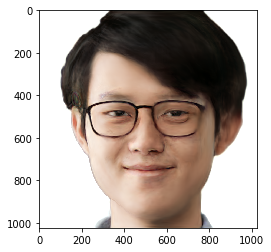

Epoch:  950
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  191.8413655757904  s
Feature loss:  6.099066257476807  | Pixel loss:  0.001299652038142085  | Total var. loss:  0.14568334817886353
Weighted - Feature loss:  609.9066257476807  | Pixel loss:  1299.652038142085  | Total var. loss:  0.0
Total loss:  1909.55859375
Target W+ output


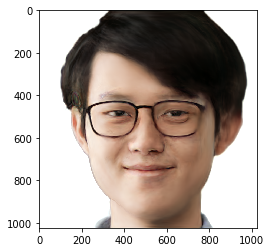

Epoch:  975
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  196.9886302947998  s
Feature loss:  6.040099620819092  | Pixel loss:  0.0011725674849003553  | Total var. loss:  0.14632005989551544
Weighted - Feature loss:  604.0099620819092  | Pixel loss:  1172.5674849003553  | Total var. loss:  0.0
Total loss:  1776.577392578125
Target W+ output


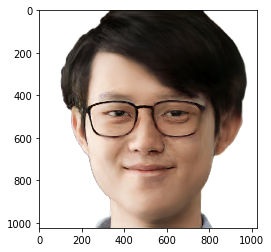

Epoch:  1000
Batch:  1
This batch:  ['TseHao1_01']
Total time elapsed:  201.9928593635559  s
Feature loss:  6.074220657348633  | Pixel loss:  0.0012720507802441716  | Total var. loss:  0.14697809517383575
Weighted - Feature loss:  607.4220657348633  | Pixel loss:  1272.0507802441716  | Total var. loss:  0.0
Total loss:  1879.472900390625
Target W+ output


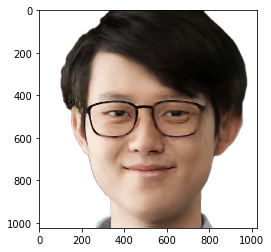

In [132]:
TrainLatentsEnc(FaceModel, FaceData, Epochs_n=1000, LearnRate=1e-2, BatchSize=1,\
                Weight_feature=1e2, Weight_pixel=1e6, Weight_tv=0, LayerCutoff=None, TrainStyle=False,\
                StoredTargetFeatures=True, PrintInterval=25, MaxBatchPrint=10, UseCuda=True)

### Save FaceData and FaceModel

In [133]:
DataPath = 'TseHao FaceSpace/FaceData.obj'
SaveFaceSpace(FaceData, DataPath, SaveFeatureMaps=False)

FaceData saved to  TseHao FaceSpace/FaceData.obj


### Load FaceData and FaceModel from saved paths

In [3]:
DataPath = 'TseHao FaceSpace/FaceData.obj'
FaceData = LoadFaceSpace(DataPath, GetFeatureMaps=False)

### Changing higher level features is kind of like style morphing

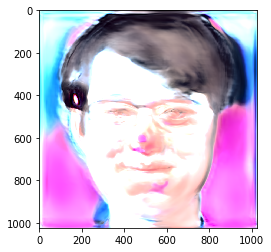

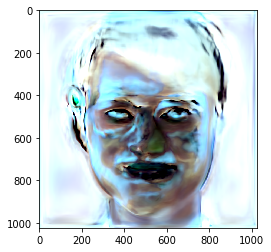

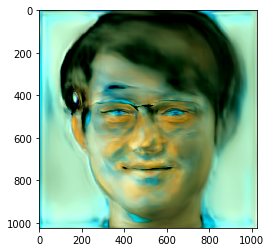

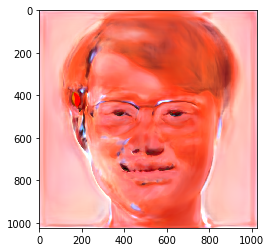

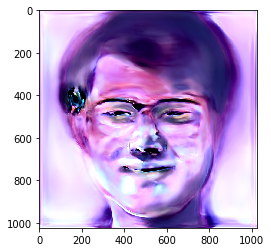

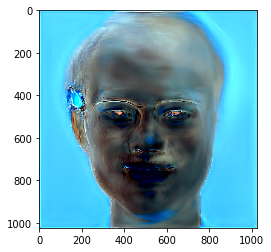

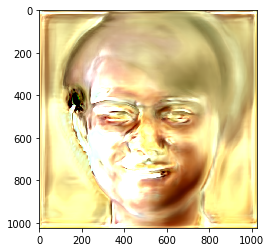

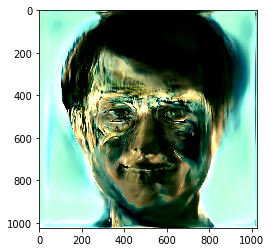

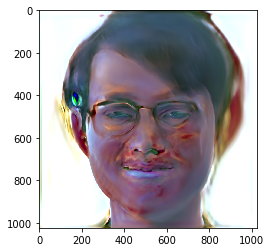

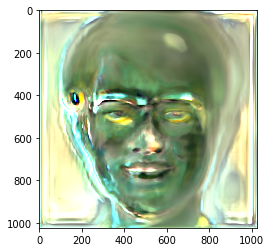

In [10]:
for _ in range(10):
    FaceChanged = FaceData.Wspace.clone()
    FaceChanged[:,9:,:] += torch.randn(512)
    ShowModelOutput(FaceModel(FaceChanged.cuda()))

### Style 1

Getting tensors of (aligned) face images
ZDims unspecified, will be inferred from number of images provided.
Zdims set equal to Size:  1
Using default Zspace - identity matrix (orthogonal vectors) of dim  1
Using default Wspace - zero matrix of dim  1


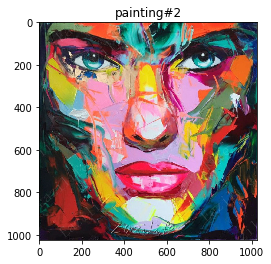

Reshaped Wspace to match number of stored faces, Wspace dim:  torch.Size([1, 18, 512])
Note: Feature Maps take up a large amount of memory, and will result in a large object file if saved.
Getting feature maps for training...
Done
Setting Wspaces to be the mean latent vector from  W_mean.pt


In [73]:
StyleData = MakeFaceData('TseHao FaceSpace/style1', GetFacesFeatures=False)

Epoch:  1
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  0.2689368724822998  s
Feature loss:  16.94041633605957  | Pixel loss:  0.05198278650641441  | Total var. loss:  0.16329127550125122
Weighted - Feature loss:  1694.041633605957  | Pixel loss:  51982.78650641441  | Total var. loss:  0.0
Total loss:  53676.828125
Target W+ output


/home/tsehao/anaconda3/envs/tth20191007/lib/python3.7/site-packages/ipykernel_launcher.py:97: UserWarning: Using a target size (torch.Size([1, 512])) that is different to the input size (torch.Size([1, 18, 512])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.


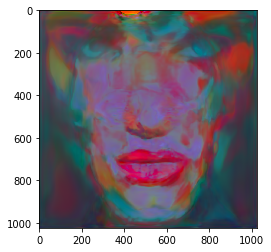

Epoch:  25
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  5.331291198730469  s
Feature loss:  20.32110023498535  | Pixel loss:  0.02185383439064026  | Total var. loss:  0.1655605435371399
Weighted - Feature loss:  2032.1100234985352  | Pixel loss:  21853.83439064026  | Total var. loss:  0.0
Total loss:  23885.943359375
Target W+ output


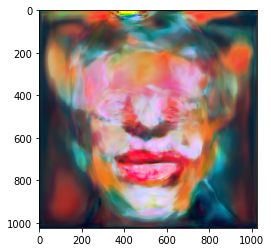

Epoch:  50
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  10.508846521377563  s
Feature loss:  20.02031135559082  | Pixel loss:  0.017840849235653877  | Total var. loss:  0.16762273013591766
Weighted - Feature loss:  2002.031135559082  | Pixel loss:  17840.849235653877  | Total var. loss:  0.0
Total loss:  19842.880859375
Target W+ output


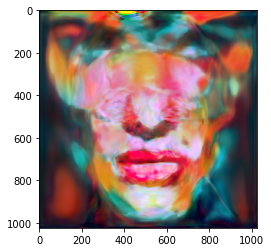

Epoch:  75
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  15.519789457321167  s
Feature loss:  19.821020126342773  | Pixel loss:  0.016285089775919914  | Total var. loss:  0.16902010142803192
Weighted - Feature loss:  1982.1020126342773  | Pixel loss:  16285.089775919914  | Total var. loss:  0.0
Total loss:  18267.19140625
Target W+ output


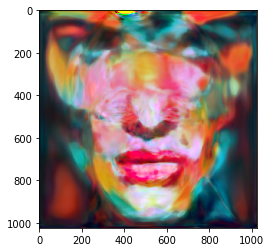

Epoch:  100
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  20.55793333053589  s
Feature loss:  19.607851028442383  | Pixel loss:  0.015444744378328323  | Total var. loss:  0.17032630741596222
Weighted - Feature loss:  1960.7851028442383  | Pixel loss:  15444.744378328323  | Total var. loss:  0.0
Total loss:  17405.529296875
Target W+ output


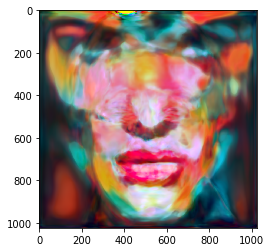

Epoch:  125
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  25.548449993133545  s
Feature loss:  19.478694915771484  | Pixel loss:  0.014718604274094105  | Total var. loss:  0.17152675986289978
Weighted - Feature loss:  1947.8694915771484  | Pixel loss:  14718.604274094105  | Total var. loss:  0.0
Total loss:  16666.474609375
Target W+ output


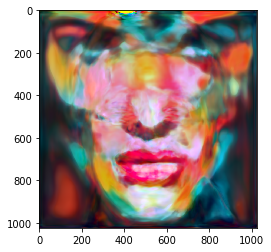

Epoch:  150
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  30.657268047332764  s
Feature loss:  19.406770706176758  | Pixel loss:  0.014244216494262218  | Total var. loss:  0.17265881597995758
Weighted - Feature loss:  1940.6770706176758  | Pixel loss:  14244.216494262218  | Total var. loss:  0.0
Total loss:  16184.8935546875
Target W+ output


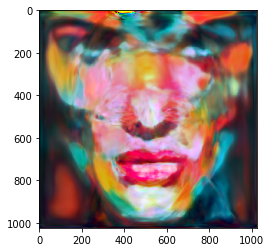

Epoch:  175
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  35.98022103309631  s
Feature loss:  19.33280372619629  | Pixel loss:  0.013953537680208683  | Total var. loss:  0.1737186163663864
Weighted - Feature loss:  1933.280372619629  | Pixel loss:  13953.537680208683  | Total var. loss:  0.0
Total loss:  15886.818359375
Target W+ output


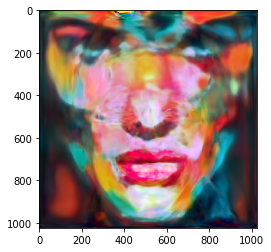

Epoch:  200
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  41.15538549423218  s
Feature loss:  19.318401336669922  | Pixel loss:  0.013619736768305302  | Total var. loss:  0.17473678290843964
Weighted - Feature loss:  1931.8401336669922  | Pixel loss:  13619.736768305302  | Total var. loss:  0.0
Total loss:  15551.576171875
Target W+ output


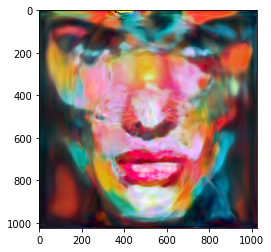

Epoch:  225
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  46.40101742744446  s
Feature loss:  19.215984344482422  | Pixel loss:  0.01354381162673235  | Total var. loss:  0.17563959956169128
Weighted - Feature loss:  1921.5984344482422  | Pixel loss:  13543.81162673235  | Total var. loss:  0.0
Total loss:  15465.41015625
Target W+ output


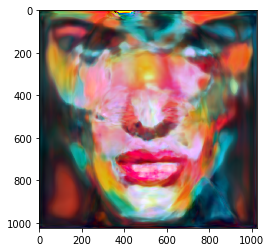

Epoch:  250
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  51.39194869995117  s
Feature loss:  19.20646858215332  | Pixel loss:  0.013549896888434887  | Total var. loss:  0.17656747996807098
Weighted - Feature loss:  1920.646858215332  | Pixel loss:  13549.896888434887  | Total var. loss:  0.0
Total loss:  15470.54296875
Target W+ output


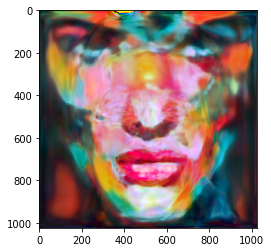

Epoch:  275
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  56.3849618434906  s
Feature loss:  19.12221908569336  | Pixel loss:  0.012984968721866608  | Total var. loss:  0.17757026851177216
Weighted - Feature loss:  1912.221908569336  | Pixel loss:  12984.968721866608  | Total var. loss:  0.0
Total loss:  14897.1904296875
Target W+ output


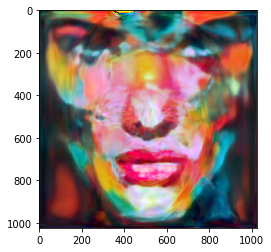

Epoch:  300
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  61.37617802619934  s
Feature loss:  19.070497512817383  | Pixel loss:  0.012926410883665085  | Total var. loss:  0.17848947644233704
Weighted - Feature loss:  1907.0497512817383  | Pixel loss:  12926.410883665085  | Total var. loss:  0.0
Total loss:  14833.4609375
Target W+ output


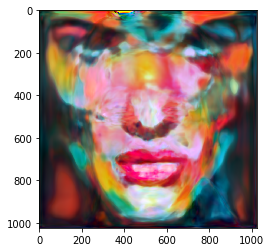

Epoch:  325
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  66.37300372123718  s
Feature loss:  19.136396408081055  | Pixel loss:  0.01288162637501955  | Total var. loss:  0.1794615089893341
Weighted - Feature loss:  1913.6396408081055  | Pixel loss:  12881.62637501955  | Total var. loss:  0.0
Total loss:  14795.265625
Target W+ output


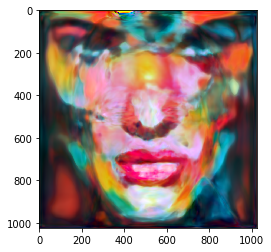

Epoch:  350
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  71.42423915863037  s
Feature loss:  19.035797119140625  | Pixel loss:  0.012574448250234127  | Total var. loss:  0.18039090931415558
Weighted - Feature loss:  1903.5797119140625  | Pixel loss:  12574.448250234127  | Total var. loss:  0.0
Total loss:  14478.0283203125
Target W+ output


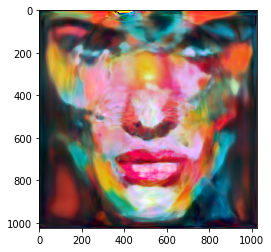

Epoch:  375
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  76.41699552536011  s
Feature loss:  18.97140884399414  | Pixel loss:  0.012424399144947529  | Total var. loss:  0.18131844699382782
Weighted - Feature loss:  1897.140884399414  | Pixel loss:  12424.399144947529  | Total var. loss:  0.0
Total loss:  14321.5400390625
Target W+ output


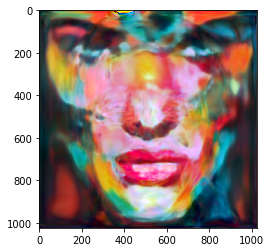

Epoch:  400
Batch:  1
This batch:  ['painting#2']
Total time elapsed:  81.43025708198547  s
Feature loss:  18.893434524536133  | Pixel loss:  0.012226414866745472  | Total var. loss:  0.18222761154174805
Weighted - Feature loss:  1889.3434524536133  | Pixel loss:  12226.414866745472  | Total var. loss:  0.0
Total loss:  14115.7587890625
Target W+ output


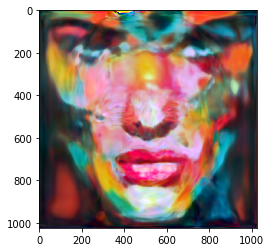

In [144]:
TrainLatentsEnc(FaceModel, StyleData, Epochs_n=400, LearnRate=1e-2, BatchSize=1,\
                Weight_feature=1e2, Weight_pixel=1e6, Weight_tv=0, LayerCutoff=None, TrainStyle=True,\
                StoredTargetFeatures=True, PrintInterval=25, MaxBatchPrint=10, UseCuda=True)

In [145]:
DataPath = 'TseHao FaceSpace/StyleData1.obj'
SaveFaceSpace(StyleData, DataPath, SaveFeatureMaps=False)

FaceData saved to  TseHao FaceSpace/StyleData1.obj


In [4]:
DataPath = 'TseHao FaceSpace/StyleData1.obj'
StyleData = LoadFaceSpace(DataPath, GetFeatureMaps=False)

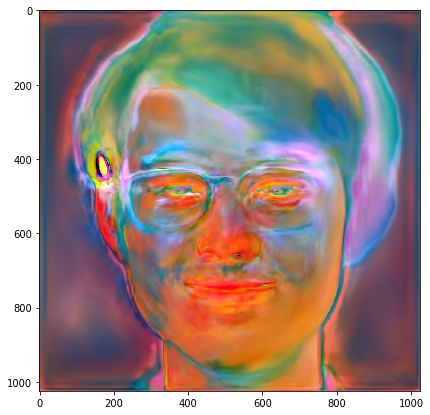

In [323]:
FaceStyled = FaceData.Wspace.clone()
LayerCutoff = 13
x = 0.8
FaceStyled[:,LayerCutoff:,:] = ((1-x)*FaceData.Wspace[:,LayerCutoff:,:] + x*StyleData.Wspace[:,LayerCutoff:,:])
ShowModelOutput(FaceModel((FaceStyled).cuda()), FigSize=7)
FaceStyled1 = FaceStyled

### Style 2 - This one didn't really manage to change much of the style during blending/transfer

Getting tensors of (aligned) face images
ZDims unspecified, will be inferred from number of images provided.
Zdims set equal to Size:  1
Using default Zspace - identity matrix (orthogonal vectors) of dim  1
Using default Wspace - zero matrix of dim  1


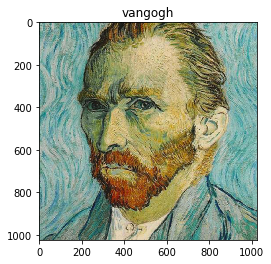

Reshaped Wspace to match number of stored faces, Wspace dim:  torch.Size([1, 18, 512])
Note: Feature Maps take up a large amount of memory, and will result in a large object file if saved.
Getting feature maps for training...
Done
Setting Wspaces to be the mean latent vector from  W_mean.pt


In [180]:
StyleData2 = MakeFaceData('TseHao FaceSpace/style2', GetFacesFeatures=False)

Epoch:  1
Batch:  1
This batch:  ['vangogh']
Total time elapsed:  0.16225790977478027  s
Feature loss:  0.0  | Pixel loss:  0.018067149445414543  | Total var. loss:  0.048860419541597366
Weighted - Feature loss:  0.0  | Pixel loss:  18067.149445414543  | Total var. loss:  0.0
Total loss:  18067.150390625
Target W+ output


/home/tsehao/anaconda3/envs/tth20191007/lib/python3.7/site-packages/ipykernel_launcher.py:97: UserWarning: Using a target size (torch.Size([1, 512])) that is different to the input size (torch.Size([1, 18, 512])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.


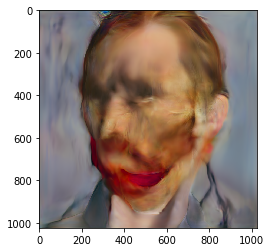

Epoch:  25
Batch:  1
This batch:  ['vangogh']
Total time elapsed:  4.869730710983276  s
Feature loss:  0.0  | Pixel loss:  0.019172921776771545  | Total var. loss:  0.0495428591966629
Weighted - Feature loss:  0.0  | Pixel loss:  19172.921776771545  | Total var. loss:  0.0
Total loss:  19172.921875
Target W+ output


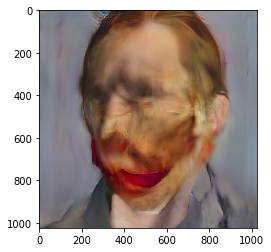

Epoch:  50
Batch:  1
This batch:  ['vangogh']
Total time elapsed:  9.766861200332642  s
Feature loss:  0.0  | Pixel loss:  0.01831711083650589  | Total var. loss:  0.04997308552265167
Weighted - Feature loss:  0.0  | Pixel loss:  18317.11083650589  | Total var. loss:  0.0
Total loss:  18317.111328125
Target W+ output


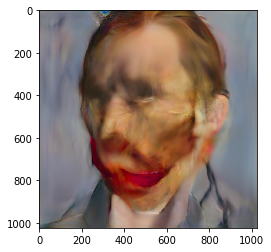

Epoch:  75
Batch:  1
This batch:  ['vangogh']
Total time elapsed:  14.617154836654663  s
Feature loss:  0.0  | Pixel loss:  0.018072661012411118  | Total var. loss:  0.05013511702418327
Weighted - Feature loss:  0.0  | Pixel loss:  18072.661012411118  | Total var. loss:  0.0
Total loss:  18072.66015625
Target W+ output


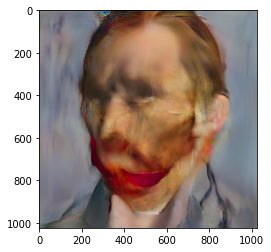

Epoch:  100
Batch:  1
This batch:  ['vangogh']
Total time elapsed:  19.503901958465576  s
Feature loss:  0.0  | Pixel loss:  0.01800762303173542  | Total var. loss:  0.05030857026576996
Weighted - Feature loss:  0.0  | Pixel loss:  18007.62303173542  | Total var. loss:  0.0
Total loss:  18007.623046875
Target W+ output


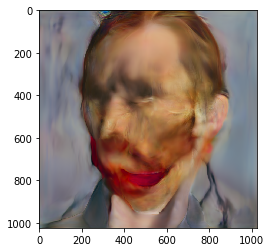

Epoch:  125
Batch:  1
This batch:  ['vangogh']
Total time elapsed:  24.395716190338135  s
Feature loss:  0.0  | Pixel loss:  0.017980633303523064  | Total var. loss:  0.05047811567783356
Weighted - Feature loss:  0.0  | Pixel loss:  17980.633303523064  | Total var. loss:  0.0
Total loss:  17980.6328125
Target W+ output


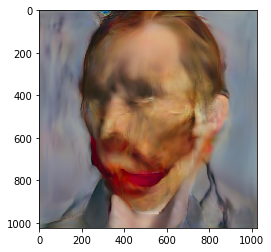

Epoch:  150
Batch:  1
This batch:  ['vangogh']
Total time elapsed:  29.389095067977905  s
Feature loss:  0.0  | Pixel loss:  0.01795780658721924  | Total var. loss:  0.05069258436560631
Weighted - Feature loss:  0.0  | Pixel loss:  17957.80658721924  | Total var. loss:  0.0
Total loss:  17957.806640625
Target W+ output


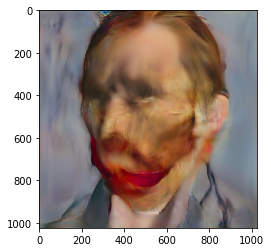

Epoch:  175
Batch:  1
This batch:  ['vangogh']
Total time elapsed:  34.2639696598053  s
Feature loss:  0.0  | Pixel loss:  0.017981646582484245  | Total var. loss:  0.0509294718503952
Weighted - Feature loss:  0.0  | Pixel loss:  17981.646582484245  | Total var. loss:  0.0
Total loss:  17981.646484375
Target W+ output


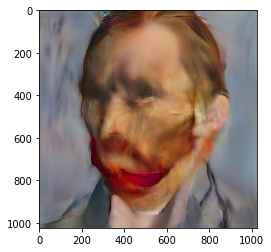

Epoch:  200
Batch:  1
This batch:  ['vangogh']
Total time elapsed:  39.07487440109253  s
Feature loss:  0.0  | Pixel loss:  0.017949551343917847  | Total var. loss:  0.05118950828909874
Weighted - Feature loss:  0.0  | Pixel loss:  17949.551343917847  | Total var. loss:  0.0
Total loss:  17949.55078125
Target W+ output


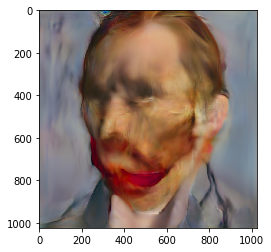

In [184]:
TrainLatentsEnc(FaceModel, StyleData2, Epochs_n=200, LearnRate=1e-2, BatchSize=1,\
                Weight_feature=0, Weight_pixel=1e6, Weight_tv=0, \
                StoredTargetFeatures=True, PrintInterval=25, MaxBatchPrint=10, UseCuda=True)

In [182]:
DataPath = 'TseHao FaceSpace/StyleData2.obj'
SaveFaceSpace(StyleData2, DataPath, SaveFeatureMaps=False)

FaceData saved to  TseHao FaceSpace/StyleData2.obj


In [5]:
DataPath = 'TseHao FaceSpace/StyleData2.obj'
StyleData2 = LoadFaceSpace(DataPath, GetFeatureMaps=False)

Getting feature maps for training...
Done


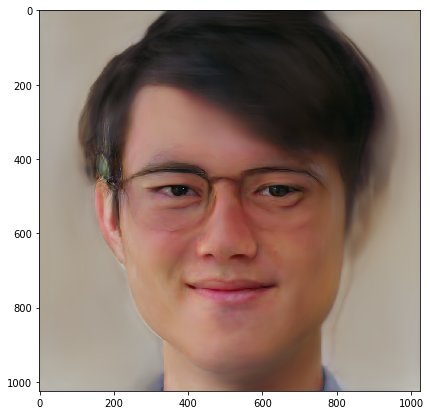

In [330]:
FaceStyled = FaceData.Wspace.clone()
LayerCutoff = 9
FaceStyled[:,LayerCutoff:,:] = StyleData2.Wspace[:,LayerCutoff:,:]
ShowModelOutput(FaceModel((FaceStyled).cuda()), FigSize=7)

### Style 3

Getting tensors of (aligned) face images
ZDims unspecified, will be inferred from number of images provided.
Zdims set equal to Size:  1
Using default Zspace - identity matrix (orthogonal vectors) of dim  1
Using default Wspace - zero matrix of dim  1


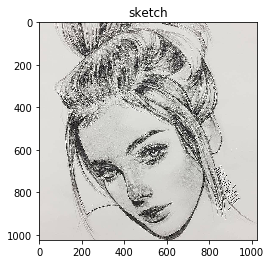

Reshaped Wspace to match number of stored faces, Wspace dim:  torch.Size([1, 18, 512])
Note: Feature Maps take up a large amount of memory, and will result in a large object file if saved.
Getting feature maps for training...
Done
Setting Wspaces to be the mean latent vector from  W_mean.pt


In [94]:
StyleData3 = MakeFaceData('TseHao FaceSpace/style3', GetFacesFeatures=False)

/home/tsehao/anaconda3/envs/tth20191007/lib/python3.7/site-packages/torch/nn/functional.py:2479: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/home/tsehao/anaconda3/envs/tth20191007/lib/python3.7/site-packages/ipykernel_launcher.py:97: UserWarning: Using a target size (torch.Size([1, 512])) that is different to the input size (torch.Size([1, 18, 512])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.


Epoch:  1
Batch:  1
This batch:  ['sketch']
Total time elapsed:  0.26790547370910645  s
Feature loss:  9.163031578063965  | Pixel loss:  0.027570156380534172  | Total var. loss:  0.07796569168567657
Weighted - Feature loss:  916.3031578063965  | Pixel loss:  27570.156380534172  | Total var. loss:  0.0
Total loss:  28486.458984375
Target W+ output


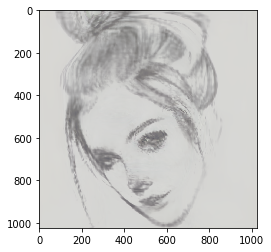

Epoch:  25
Batch:  1
This batch:  ['sketch']
Total time elapsed:  5.166610240936279  s
Feature loss:  11.447418212890625  | Pixel loss:  0.02039411850273609  | Total var. loss:  0.0792027935385704
Weighted - Feature loss:  1144.7418212890625  | Pixel loss:  20394.11850273609  | Total var. loss:  0.0
Total loss:  21538.861328125
Target W+ output


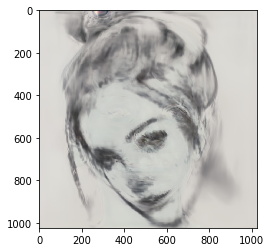

Epoch:  50
Batch:  1
This batch:  ['sketch']
Total time elapsed:  10.389922380447388  s
Feature loss:  11.217170715332031  | Pixel loss:  0.018849452957510948  | Total var. loss:  0.08049167692661285
Weighted - Feature loss:  1121.7170715332031  | Pixel loss:  18849.45295751095  | Total var. loss:  0.0
Total loss:  19971.169921875
Target W+ output


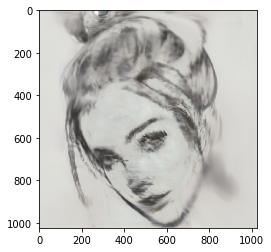

Epoch:  75
Batch:  1
This batch:  ['sketch']
Total time elapsed:  15.516340732574463  s
Feature loss:  11.020017623901367  | Pixel loss:  0.018309634178876877  | Total var. loss:  0.08166966587305069
Weighted - Feature loss:  1102.0017623901367  | Pixel loss:  18309.634178876877  | Total var. loss:  0.0
Total loss:  19411.63671875
Target W+ output


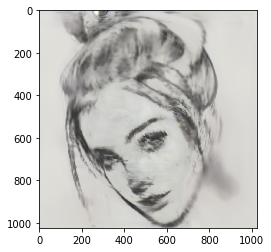

Epoch:  100
Batch:  1
This batch:  ['sketch']
Total time elapsed:  20.599226713180542  s
Feature loss:  10.949871063232422  | Pixel loss:  0.018042070791125298  | Total var. loss:  0.08263044059276581
Weighted - Feature loss:  1094.9871063232422  | Pixel loss:  18042.070791125298  | Total var. loss:  0.0
Total loss:  19137.056640625
Target W+ output


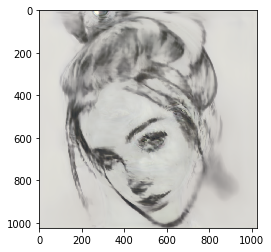

Epoch:  125
Batch:  1
This batch:  ['sketch']
Total time elapsed:  25.690533876419067  s
Feature loss:  10.839947700500488  | Pixel loss:  0.017798086628317833  | Total var. loss:  0.08355706930160522
Weighted - Feature loss:  1083.9947700500488  | Pixel loss:  17798.086628317833  | Total var. loss:  0.0
Total loss:  18882.080078125
Target W+ output


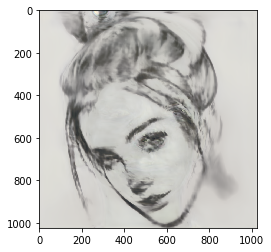

Epoch:  150
Batch:  1
This batch:  ['sketch']
Total time elapsed:  30.687644481658936  s
Feature loss:  10.803430557250977  | Pixel loss:  0.017621196806430817  | Total var. loss:  0.08436444401741028
Weighted - Feature loss:  1080.3430557250977  | Pixel loss:  17621.196806430817  | Total var. loss:  0.0
Total loss:  18701.541015625
Target W+ output


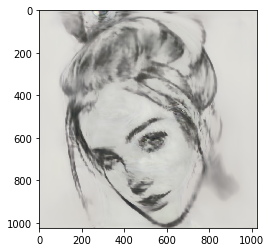

Epoch:  175
Batch:  1
This batch:  ['sketch']
Total time elapsed:  35.70836615562439  s
Feature loss:  10.731766700744629  | Pixel loss:  0.01751018315553665  | Total var. loss:  0.08510325849056244
Weighted - Feature loss:  1073.176670074463  | Pixel loss:  17510.18315553665  | Total var. loss:  0.0
Total loss:  18583.359375
Target W+ output


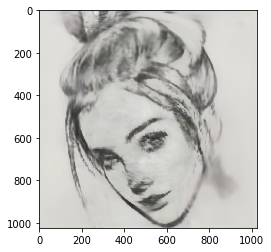

Epoch:  200
Batch:  1
This batch:  ['sketch']
Total time elapsed:  40.6967408657074  s
Feature loss:  10.719130516052246  | Pixel loss:  0.01742105558514595  | Total var. loss:  0.08582155406475067
Weighted - Feature loss:  1071.9130516052246  | Pixel loss:  17421.05558514595  | Total var. loss:  0.0
Total loss:  18492.96875
Target W+ output


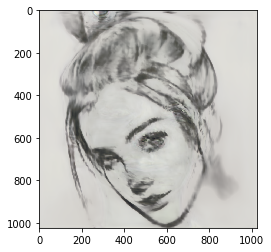

Epoch:  225
Batch:  1
This batch:  ['sketch']
Total time elapsed:  45.69174408912659  s
Feature loss:  10.68626594543457  | Pixel loss:  0.0173166636377573  | Total var. loss:  0.08652050048112869
Weighted - Feature loss:  1068.626594543457  | Pixel loss:  17316.6636377573  | Total var. loss:  0.0
Total loss:  18385.291015625
Target W+ output


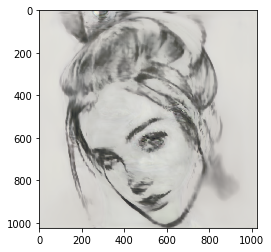

Epoch:  250
Batch:  1
This batch:  ['sketch']
Total time elapsed:  50.84568381309509  s
Feature loss:  10.686012268066406  | Pixel loss:  0.017300497740507126  | Total var. loss:  0.08726471662521362
Weighted - Feature loss:  1068.6012268066406  | Pixel loss:  17300.497740507126  | Total var. loss:  0.0
Total loss:  18369.099609375
Target W+ output


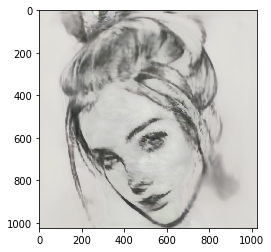

Epoch:  275
Batch:  1
This batch:  ['sketch']
Total time elapsed:  56.16632270812988  s
Feature loss:  10.642852783203125  | Pixel loss:  0.017165139317512512  | Total var. loss:  0.08803637325763702
Weighted - Feature loss:  1064.2852783203125  | Pixel loss:  17165.139317512512  | Total var. loss:  0.0
Total loss:  18229.423828125
Target W+ output


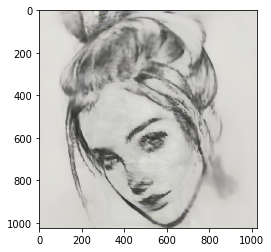

Epoch:  300
Batch:  1
This batch:  ['sketch']
Total time elapsed:  61.15601086616516  s
Feature loss:  10.640852928161621  | Pixel loss:  0.01728046126663685  | Total var. loss:  0.08876613527536392
Weighted - Feature loss:  1064.085292816162  | Pixel loss:  17280.46126663685  | Total var. loss:  0.0
Total loss:  18344.546875
Target W+ output


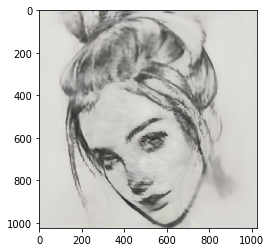

Epoch:  325
Batch:  1
This batch:  ['sketch']
Total time elapsed:  66.16112065315247  s
Feature loss:  10.614562034606934  | Pixel loss:  0.016981089487671852  | Total var. loss:  0.08950807899236679
Weighted - Feature loss:  1061.4562034606934  | Pixel loss:  16981.089487671852  | Total var. loss:  0.0
Total loss:  18042.546875
Target W+ output


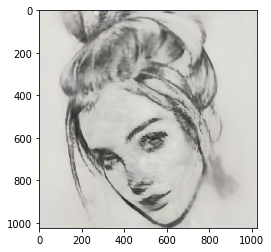

Epoch:  350
Batch:  1
This batch:  ['sketch']
Total time elapsed:  71.16653299331665  s
Feature loss:  10.654129028320312  | Pixel loss:  0.01709495298564434  | Total var. loss:  0.09022684395313263
Weighted - Feature loss:  1065.4129028320312  | Pixel loss:  17094.95298564434  | Total var. loss:  0.0
Total loss:  18160.365234375
Target W+ output


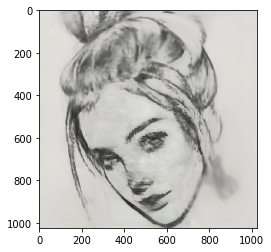

Epoch:  375
Batch:  1
This batch:  ['sketch']
Total time elapsed:  76.26370882987976  s
Feature loss:  10.632987022399902  | Pixel loss:  0.016962088644504547  | Total var. loss:  0.09090112149715424
Weighted - Feature loss:  1063.2987022399902  | Pixel loss:  16962.088644504547  | Total var. loss:  0.0
Total loss:  18025.38671875
Target W+ output


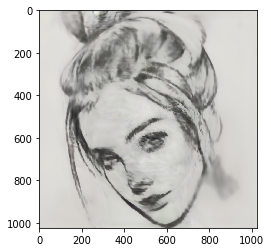

Epoch:  400
Batch:  1
This batch:  ['sketch']
Total time elapsed:  81.43436074256897  s
Feature loss:  10.592436790466309  | Pixel loss:  0.0169675275683403  | Total var. loss:  0.09159152209758759
Weighted - Feature loss:  1059.2436790466309  | Pixel loss:  16967.5275683403  | Total var. loss:  0.0
Total loss:  18026.771484375
Target W+ output


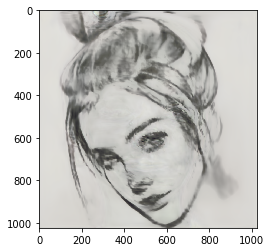

In [164]:
TrainLatentsEnc(FaceModel, StyleData3, Epochs_n=400, LearnRate=1e-2, BatchSize=1,\
                Weight_feature=1e2, Weight_pixel=1e6, Weight_tv=0, LayerCutoff=None, TrainStyle=True,\
                StoredTargetFeatures=True, PrintInterval=25, MaxBatchPrint=10, UseCuda=True)

In [165]:
DataPath = 'TseHao FaceSpace/StyleData3.obj'
SaveFaceSpace(StyleData3, DataPath, SaveFeatureMaps=False)

FaceData saved to  TseHao FaceSpace/StyleData3.obj


In [196]:
DataPath = 'TseHao FaceSpace/StyleData3.obj'
StyleData3 = LoadFaceSpace(DataPath, GetFeatureMaps=False)

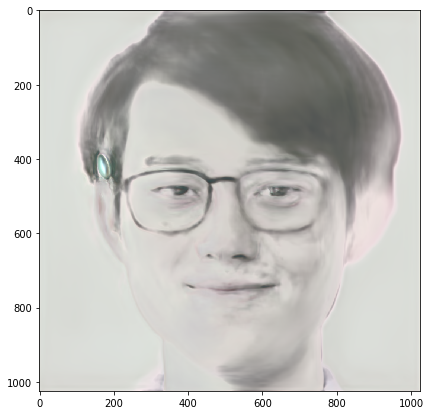

In [229]:
FaceStyled = FaceData.Wspace.clone()
LayerCutoff = 13
FaceStyled[:,LayerCutoff:,:] = StyleData3.Wspace[:,LayerCutoff:,:]
ShowModelOutput(FaceModel((FaceStyled).cuda()), FigSize=7)
FaceStyled3 = FaceStyled

### Style 4

Getting tensors of (aligned) face images
ZDims unspecified, will be inferred from number of images provided.
Zdims set equal to Size:  1
Using default Zspace - identity matrix (orthogonal vectors) of dim  1
Using default Wspace - zero matrix of dim  1


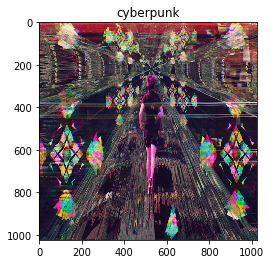

Reshaped Wspace to match number of stored faces, Wspace dim:  torch.Size([1, 18, 512])
Note: Feature Maps take up a large amount of memory, and will result in a large object file if saved.
Getting feature maps for training...
Done
Setting Wspaces to be the mean latent vector from  W_mean.pt


In [200]:
StyleData4 = MakeFaceData('TseHao FaceSpace/style4', GetFacesFeatures=False)

Epoch:  1
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  0.19519734382629395  s
Feature loss:  0.0  | Pixel loss:  0.015996480360627174  | Total var. loss:  0.080849289894104
Weighted - Feature loss:  0.0  | Pixel loss:  15996.480360627174  | Total var. loss:  0.0
Total loss:  15996.48046875
Target W+ output


/home/tsehao/anaconda3/envs/tth20191007/lib/python3.7/site-packages/ipykernel_launcher.py:97: UserWarning: Using a target size (torch.Size([1, 512])) that is different to the input size (torch.Size([1, 18, 512])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.


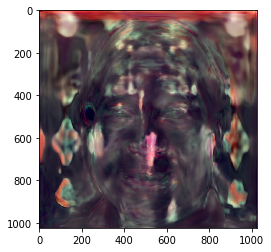

Epoch:  25
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  4.864266395568848  s
Feature loss:  0.0  | Pixel loss:  0.015438986010849476  | Total var. loss:  0.08092370629310608
Weighted - Feature loss:  0.0  | Pixel loss:  15438.986010849476  | Total var. loss:  0.0
Total loss:  15438.986328125
Target W+ output


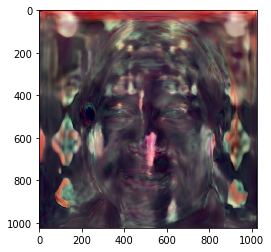

Epoch:  50
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  9.62357783317566  s
Feature loss:  0.0  | Pixel loss:  0.015406724996864796  | Total var. loss:  0.08106771856546402
Weighted - Feature loss:  0.0  | Pixel loss:  15406.724996864796  | Total var. loss:  0.0
Total loss:  15406.724609375
Target W+ output


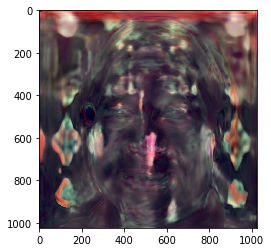

Epoch:  75
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  14.341528177261353  s
Feature loss:  0.0  | Pixel loss:  0.015391417779028416  | Total var. loss:  0.08122117072343826
Weighted - Feature loss:  0.0  | Pixel loss:  15391.417779028416  | Total var. loss:  0.0
Total loss:  15391.41796875
Target W+ output


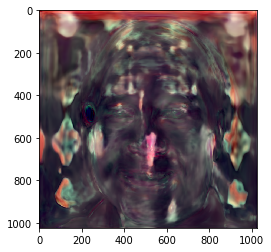

Epoch:  100
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  19.04304528236389  s
Feature loss:  0.0  | Pixel loss:  0.015377686358988285  | Total var. loss:  0.08138668537139893
Weighted - Feature loss:  0.0  | Pixel loss:  15377.686358988285  | Total var. loss:  0.0
Total loss:  15377.6865234375
Target W+ output


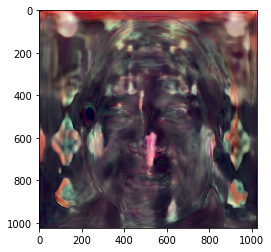

Epoch:  125
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  23.8084454536438  s
Feature loss:  0.0  | Pixel loss:  0.015363551676273346  | Total var. loss:  0.08156529814004898
Weighted - Feature loss:  0.0  | Pixel loss:  15363.551676273346  | Total var. loss:  0.0
Total loss:  15363.5517578125
Target W+ output


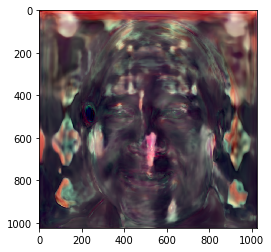

Epoch:  150
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  28.833741903305054  s
Feature loss:  0.0  | Pixel loss:  0.015348979271948338  | Total var. loss:  0.08175743371248245
Weighted - Feature loss:  0.0  | Pixel loss:  15348.979271948338  | Total var. loss:  0.0
Total loss:  15348.9794921875
Target W+ output


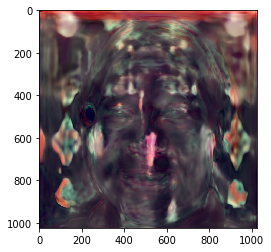

Epoch:  175
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  33.77500939369202  s
Feature loss:  0.0  | Pixel loss:  0.015334397554397583  | Total var. loss:  0.08195504546165466
Weighted - Feature loss:  0.0  | Pixel loss:  15334.397554397583  | Total var. loss:  0.0
Total loss:  15334.3974609375
Target W+ output


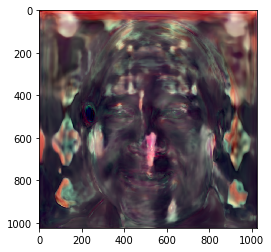

Epoch:  200
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  38.799081802368164  s
Feature loss:  0.0  | Pixel loss:  0.015319821424782276  | Total var. loss:  0.08216303586959839
Weighted - Feature loss:  0.0  | Pixel loss:  15319.821424782276  | Total var. loss:  0.0
Total loss:  15319.8212890625
Target W+ output


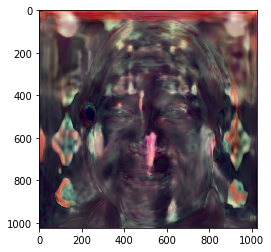

Epoch:  225
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  43.832093954086304  s
Feature loss:  0.0  | Pixel loss:  0.01530445646494627  | Total var. loss:  0.0823795422911644
Weighted - Feature loss:  0.0  | Pixel loss:  15304.45646494627  | Total var. loss:  0.0
Total loss:  15304.4560546875
Target W+ output


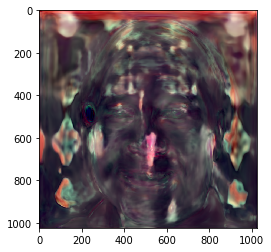

Epoch:  250
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  48.682781457901  s
Feature loss:  0.0  | Pixel loss:  0.015289912931621075  | Total var. loss:  0.08260029554367065
Weighted - Feature loss:  0.0  | Pixel loss:  15289.912931621075  | Total var. loss:  0.0
Total loss:  15289.9130859375
Target W+ output


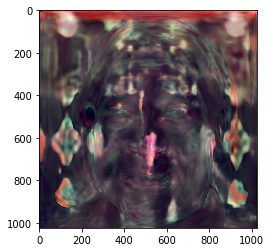

Epoch:  275
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  53.600696086883545  s
Feature loss:  0.0  | Pixel loss:  0.015274561010301113  | Total var. loss:  0.08282769471406937
Weighted - Feature loss:  0.0  | Pixel loss:  15274.561010301113  | Total var. loss:  0.0
Total loss:  15274.560546875
Target W+ output


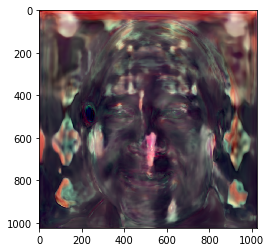

Epoch:  300
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  58.40139412879944  s
Feature loss:  0.0  | Pixel loss:  0.015260008163750172  | Total var. loss:  0.08306014537811279
Weighted - Feature loss:  0.0  | Pixel loss:  15260.008163750172  | Total var. loss:  0.0
Total loss:  15260.0078125
Target W+ output


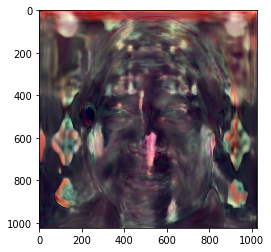

Epoch:  325
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  63.21323752403259  s
Feature loss:  0.0  | Pixel loss:  0.015244558453559875  | Total var. loss:  0.08329752087593079
Weighted - Feature loss:  0.0  | Pixel loss:  15244.558453559875  | Total var. loss:  0.0
Total loss:  15244.55859375
Target W+ output


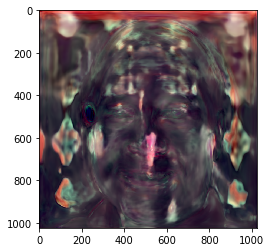

Epoch:  350
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  67.98027062416077  s
Feature loss:  0.0  | Pixel loss:  0.01523000467568636  | Total var. loss:  0.08353427052497864
Weighted - Feature loss:  0.0  | Pixel loss:  15230.00467568636  | Total var. loss:  0.0
Total loss:  15230.0048828125
Target W+ output


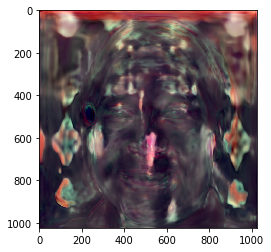

Epoch:  375
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  72.70550918579102  s
Feature loss:  0.0  | Pixel loss:  0.015216655097901821  | Total var. loss:  0.0837690681219101
Weighted - Feature loss:  0.0  | Pixel loss:  15216.655097901821  | Total var. loss:  0.0
Total loss:  15216.6552734375
Target W+ output


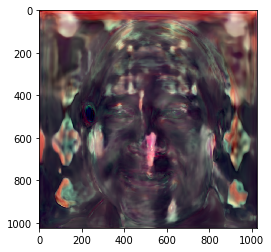

Epoch:  400
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  77.63800096511841  s
Feature loss:  0.0  | Pixel loss:  0.015199628658592701  | Total var. loss:  0.08400389552116394
Weighted - Feature loss:  0.0  | Pixel loss:  15199.628658592701  | Total var. loss:  0.0
Total loss:  15199.62890625
Target W+ output


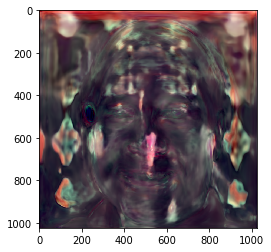

Epoch:  425
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  82.61813235282898  s
Feature loss:  0.0  | Pixel loss:  0.015186780132353306  | Total var. loss:  0.08424349874258041
Weighted - Feature loss:  0.0  | Pixel loss:  15186.780132353306  | Total var. loss:  0.0
Total loss:  15186.7802734375
Target W+ output


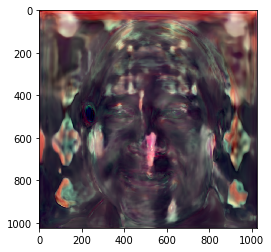

Epoch:  450
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  87.54827189445496  s
Feature loss:  0.0  | Pixel loss:  0.015171215869486332  | Total var. loss:  0.08449313044548035
Weighted - Feature loss:  0.0  | Pixel loss:  15171.215869486332  | Total var. loss:  0.0
Total loss:  15171.2158203125
Target W+ output


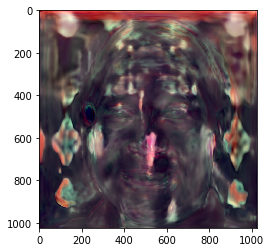

Epoch:  475
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  92.29147601127625  s
Feature loss:  0.0  | Pixel loss:  0.015160217881202698  | Total var. loss:  0.08474823832511902
Weighted - Feature loss:  0.0  | Pixel loss:  15160.217881202698  | Total var. loss:  0.0
Total loss:  15160.2177734375
Target W+ output


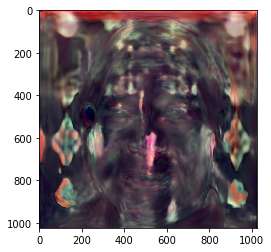

Epoch:  500
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  96.99755311012268  s
Feature loss:  0.0  | Pixel loss:  0.015142138116061687  | Total var. loss:  0.08500286936759949
Weighted - Feature loss:  0.0  | Pixel loss:  15142.138116061687  | Total var. loss:  0.0
Total loss:  15142.1376953125
Target W+ output


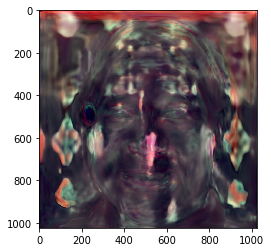

Epoch:  525
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  101.69111704826355  s
Feature loss:  0.0  | Pixel loss:  0.01512895803898573  | Total var. loss:  0.08525265008211136
Weighted - Feature loss:  0.0  | Pixel loss:  15128.95803898573  | Total var. loss:  0.0
Total loss:  15128.9580078125
Target W+ output


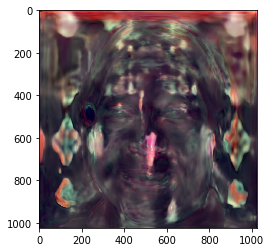

Epoch:  550
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  106.3881287574768  s
Feature loss:  0.0  | Pixel loss:  0.01511398795992136  | Total var. loss:  0.08550318330526352
Weighted - Feature loss:  0.0  | Pixel loss:  15113.98795992136  | Total var. loss:  0.0
Total loss:  15113.98828125
Target W+ output


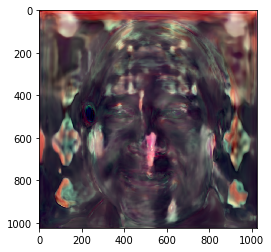

Epoch:  575
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  111.08423256874084  s
Feature loss:  0.0  | Pixel loss:  0.015097136609256268  | Total var. loss:  0.08575484901666641
Weighted - Feature loss:  0.0  | Pixel loss:  15097.136609256268  | Total var. loss:  0.0
Total loss:  15097.13671875
Target W+ output


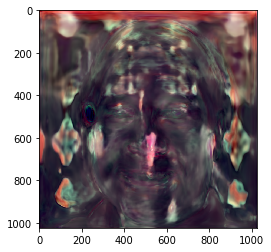

Epoch:  600
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  115.7831802368164  s
Feature loss:  0.0  | Pixel loss:  0.015083146281540394  | Total var. loss:  0.08601042628288269
Weighted - Feature loss:  0.0  | Pixel loss:  15083.146281540394  | Total var. loss:  0.0
Total loss:  15083.146484375
Target W+ output


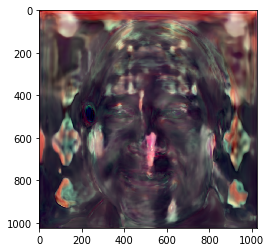

Epoch:  625
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  120.87555575370789  s
Feature loss:  0.0  | Pixel loss:  0.015070122666656971  | Total var. loss:  0.08626575767993927
Weighted - Feature loss:  0.0  | Pixel loss:  15070.122666656971  | Total var. loss:  0.0
Total loss:  15070.123046875
Target W+ output


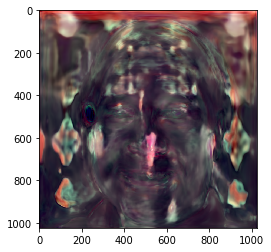

Epoch:  650
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  125.79245281219482  s
Feature loss:  0.0  | Pixel loss:  0.015059526078402996  | Total var. loss:  0.08652332425117493
Weighted - Feature loss:  0.0  | Pixel loss:  15059.526078402996  | Total var. loss:  0.0
Total loss:  15059.5263671875
Target W+ output


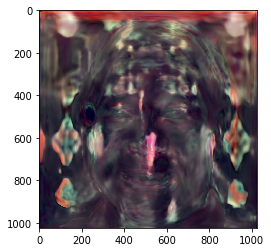

Epoch:  675
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  130.4940369129181  s
Feature loss:  0.0  | Pixel loss:  0.015042267739772797  | Total var. loss:  0.08678942173719406
Weighted - Feature loss:  0.0  | Pixel loss:  15042.267739772797  | Total var. loss:  0.0
Total loss:  15042.267578125
Target W+ output


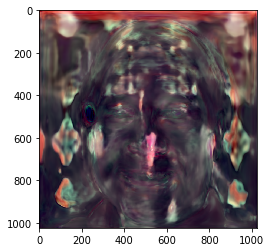

Epoch:  700
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  135.26232957839966  s
Feature loss:  0.0  | Pixel loss:  0.015030670911073685  | Total var. loss:  0.08706358820199966
Weighted - Feature loss:  0.0  | Pixel loss:  15030.670911073685  | Total var. loss:  0.0
Total loss:  15030.6708984375
Target W+ output


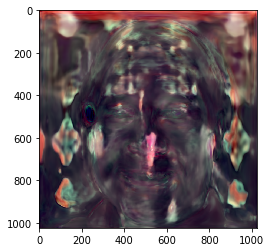

Epoch:  725
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  139.95245385169983  s
Feature loss:  0.0  | Pixel loss:  0.015018071047961712  | Total var. loss:  0.08733409643173218
Weighted - Feature loss:  0.0  | Pixel loss:  15018.071047961712  | Total var. loss:  0.0
Total loss:  15018.0712890625
Target W+ output


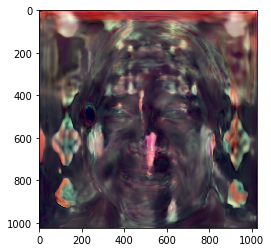

Epoch:  750
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  144.64832878112793  s
Feature loss:  0.0  | Pixel loss:  0.015000191517174244  | Total var. loss:  0.08759766072034836
Weighted - Feature loss:  0.0  | Pixel loss:  15000.191517174244  | Total var. loss:  0.0
Total loss:  15000.19140625
Target W+ output


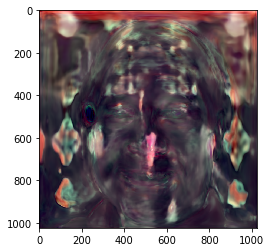

Epoch:  775
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  149.33943557739258  s
Feature loss:  0.0  | Pixel loss:  0.01499047502875328  | Total var. loss:  0.08786270022392273
Weighted - Feature loss:  0.0  | Pixel loss:  14990.47502875328  | Total var. loss:  0.0
Total loss:  14990.474609375
Target W+ output


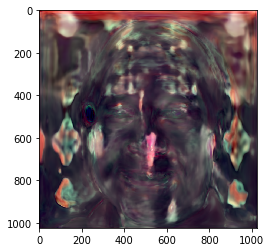

Epoch:  800
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  154.2675907611847  s
Feature loss:  0.0  | Pixel loss:  0.014975513331592083  | Total var. loss:  0.08812868595123291
Weighted - Feature loss:  0.0  | Pixel loss:  14975.513331592083  | Total var. loss:  0.0
Total loss:  14975.513671875
Target W+ output


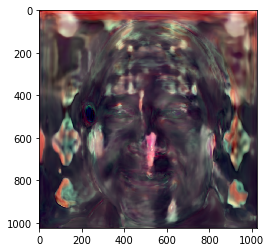

Epoch:  825
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  159.02716875076294  s
Feature loss:  0.0  | Pixel loss:  0.014966003596782684  | Total var. loss:  0.08839691430330276
Weighted - Feature loss:  0.0  | Pixel loss:  14966.003596782684  | Total var. loss:  0.0
Total loss:  14966.00390625
Target W+ output


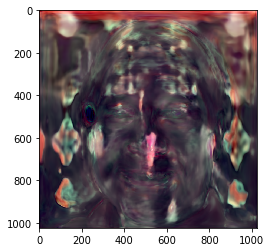

Epoch:  850
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  163.7933030128479  s
Feature loss:  0.0  | Pixel loss:  0.014948326162993908  | Total var. loss:  0.08866337686777115
Weighted - Feature loss:  0.0  | Pixel loss:  14948.326162993908  | Total var. loss:  0.0
Total loss:  14948.326171875
Target W+ output


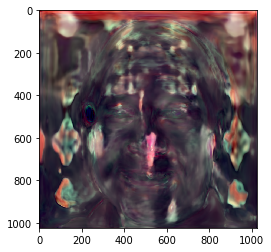

Epoch:  875
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  168.5607714653015  s
Feature loss:  0.0  | Pixel loss:  0.014938813634216785  | Total var. loss:  0.08892299979925156
Weighted - Feature loss:  0.0  | Pixel loss:  14938.813634216785  | Total var. loss:  0.0
Total loss:  14938.8134765625
Target W+ output


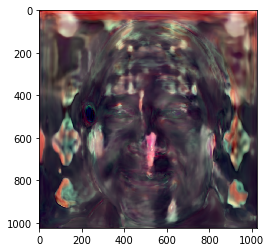

Epoch:  900
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  173.25040531158447  s
Feature loss:  0.0  | Pixel loss:  0.014925199560821056  | Total var. loss:  0.08917983621358871
Weighted - Feature loss:  0.0  | Pixel loss:  14925.199560821056  | Total var. loss:  0.0
Total loss:  14925.19921875
Target W+ output


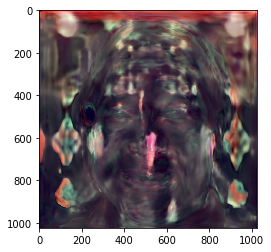

Epoch:  925
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  177.944433927536  s
Feature loss:  0.0  | Pixel loss:  0.014912254177033901  | Total var. loss:  0.08943602442741394
Weighted - Feature loss:  0.0  | Pixel loss:  14912.254177033901  | Total var. loss:  0.0
Total loss:  14912.25390625
Target W+ output


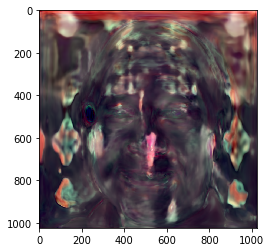

Epoch:  950
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  182.63985466957092  s
Feature loss:  0.0  | Pixel loss:  0.01490688230842352  | Total var. loss:  0.08968867361545563
Weighted - Feature loss:  0.0  | Pixel loss:  14906.88230842352  | Total var. loss:  0.0
Total loss:  14906.8818359375
Target W+ output


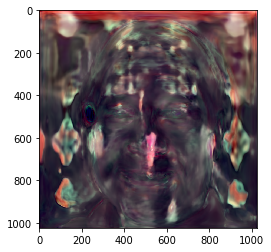

Epoch:  975
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  187.33992052078247  s
Feature loss:  0.0  | Pixel loss:  0.014891630969941616  | Total var. loss:  0.08993719518184662
Weighted - Feature loss:  0.0  | Pixel loss:  14891.630969941616  | Total var. loss:  0.0
Total loss:  14891.630859375
Target W+ output


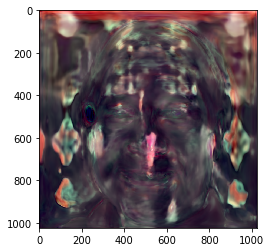

Epoch:  1000
Batch:  1
This batch:  ['cyberpunk']
Total time elapsed:  192.30231714248657  s
Feature loss:  0.0  | Pixel loss:  0.014886225573718548  | Total var. loss:  0.09018591791391373
Weighted - Feature loss:  0.0  | Pixel loss:  14886.225573718548  | Total var. loss:  0.0
Total loss:  14886.2255859375
Target W+ output


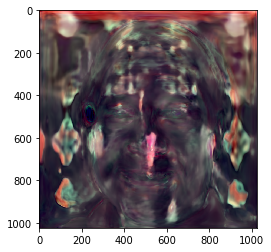

In [209]:
TrainLatentsEnc(FaceModel, StyleData4, Epochs_n=1000, LearnRate=1e-3, BatchSize=1,\
                Weight_feature=0, Weight_pixel=1e6, Weight_tv=0, LayerCutoff=None, TrainStyle=True,\
                StoredTargetFeatures=True, PrintInterval=25, MaxBatchPrint=10, UseCuda=True)

In [210]:
DataPath = 'TseHao FaceSpace/StyleData4.obj'
SaveFaceSpace(StyleData4, DataPath, SaveFeatureMaps=False)

FaceData saved to  TseHao FaceSpace/StyleData4.obj


In [196]:
DataPath = 'TseHao FaceSpace/StyleData4.obj'
StyleData4 = LoadFaceSpace(DataPath, GetFeatureMaps=False)

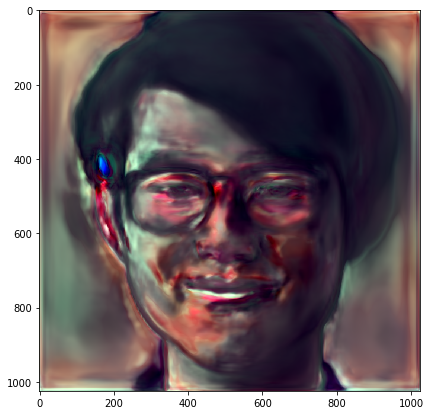

In [217]:
FaceStyled = FaceData.Wspace.clone()
LayerCutoff = 11
FaceStyled[:,LayerCutoff:,:] = StyleData4.Wspace[:,LayerCutoff:,:]
ShowModelOutput(FaceModel((FaceStyled).cuda()), FigSize=7)
FaceStyled4 = FaceStyled

### Let's make a cool animation thing

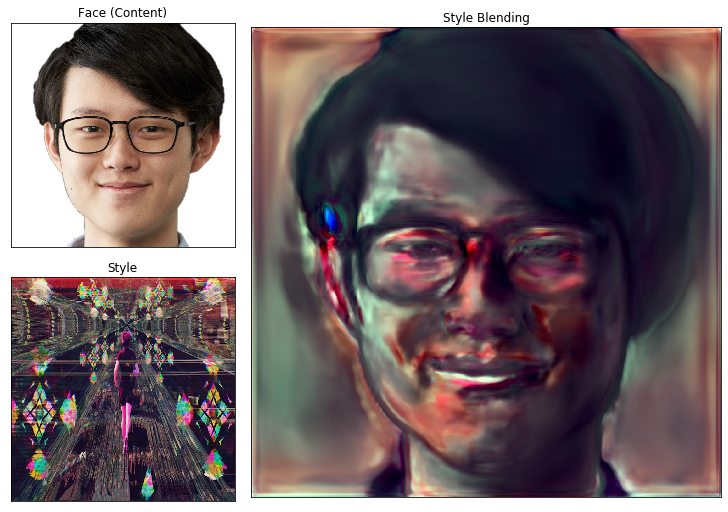

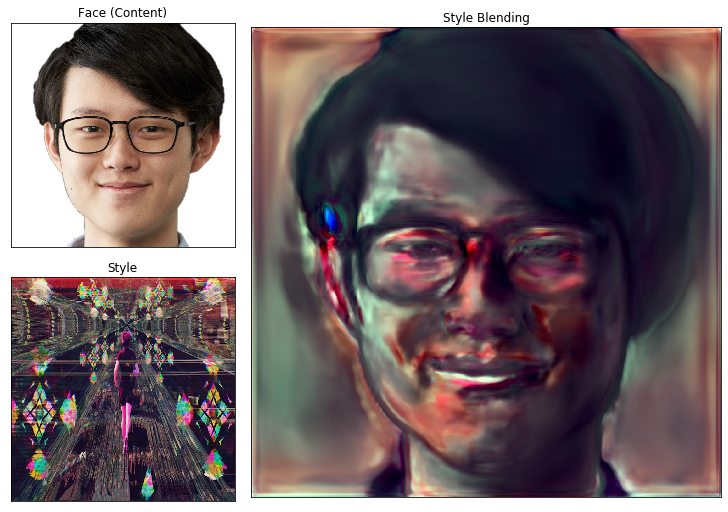

In [375]:
from plot_utils import InterpolateCompressed
import IPython
import matplotlib.pyplot as plt

FixedLatents = [FaceData.Wspace, FaceStyled1, FaceStyled3, FaceStyled4]
Latents = []
Steps = 5
for i in range(len(FixedLatents)-1):
    Latents.append(FixedLatents[i] + (FixedLatents[i + 1] - FixedLatents[i]) * \
                   torch.arange(0, 1, 1/Steps).view(-1,1,1))
Latents.append(FixedLatents[-1])
Latents = torch.cat(Latents, dim=0)

fig = plt.figure(constrained_layout=True, figsize=(10,7))
gs1 = fig.add_gridspec(nrows=2, ncols=3, left=0.05, right=0.48, wspace=0.05)
ax_styledface = fig.add_subplot(gs1[:, 1:])
ax_face = fig.add_subplot(gs1[0, 0])
ax_style = fig.add_subplot(gs1[1, 0])

axes = [ax_styledface, ax_face, ax_style]
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])

ax_face.set_title('Face (Content)')
ax_style.set_title('Style')
ax_styledface.set_title('Style Blending')

ax_face.imshow(FaceData.Faces[0].cpu().permute(1, 2, 0).numpy())

Styles = [StyleData.Faces[0].cpu().permute(1, 2, 0).numpy(),
         StyleData3.Faces[0].cpu().permute(1, 2, 0).numpy(),
         StyleData4.Faces[0].cpu().permute(1, 2, 0).numpy()]
StyleCount = 0
ax_style.imshow(Styles[StyleCount])

for i, Latent in enumerate(Latents):
    
    if i > (StyleCount + 1)*Steps:
        StyleCount += 1
        ax_style.imshow(Styles[StyleCount])
    
    ModelOut = FaceModel((Latent.unsqueeze(0)).cuda())
    ModelOut = ModelOut.clamp_(-1, 1).add_(1).div_(2.0)
    Img = ModelOut.detach().squeeze(0).cpu().permute(1, 2, 0).numpy()
    ax_styledface.imshow(Img)
    IPython.display.clear_output(True)
    IPython.display.display(fig)